In [2]:
pip install xgboost

Note: you may need to restart the kernel to use updated packages.


In [14]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [16]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import sklearn
import itertools
import sklearn.metrics as metrics
from sklearn.metrics import classification_report

from sklearn import datasets, metrics
from sklearn.metrics import confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import LinearSVC, SVC
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.ensemble import BaggingClassifier
import xgboost as xgb

In [18]:
data = pd.read_csv("C:/Users/ASUS/Desktop/Subash/7th sem/idp/pd_speech_features.csv")

In [20]:
data.head(500)

,id,gender,PPE,DFA,RPDE,numPulses,numPeriodsPulses,meanPeriodPulses,stdDevPeriodPulses,locPctJitter,...,tqwt_kurtosisValue_dec_28,tqwt_kurtosisValue_dec_29,tqwt_kurtosisValue_dec_30,tqwt_kurtosisValue_dec_31,tqwt_kurtosisValue_dec_32,tqwt_kurtosisValue_dec_33,tqwt_kurtosisValue_dec_34,tqwt_kurtosisValue_dec_35,tqwt_kurtosisValue_dec_36,class
0,0,1,0.85247,0.71826,0.57227,240,239,0.008064,0.000087,0.00218,...,1.5620,2.6445,3.8686,4.2105,5.1221,4.4625,2.6202,3.0004,18.9405,1
1,0,1,0.76686,0.69481,0.53966,234,233,0.008258,0.000073,0.00195,...,1.5589,3.6107,23.5155,14.1962,11.0261,9.5082,6.5245,6.3431,45.1780,1
2,0,1,0.85083,0.67604,0.58982,232,231,0.008340,0.000060,0.00176,...,1.5643,2.3308,9.4959,10.7458,11.0177,4.8066,2.9199,3.1495,4.7666,1
3,1,0,0.41121,0.79672,0.59257,178,177,0.010858,0.000183,0.00419,...,3.7805,3.5664,5.2558,14.0403,4.2235,4.6857,4.8460,6.2650,4.0603,1
4,1,0,0.32790,0.79782,0.53028,236,235,0.008162,0.002669,0.00535,...,6.1727,5.8416,6.0805,5.7621,7.7817,11.6891,8.2103,5.0559,6.1164,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
495,165,1,0.81834,0.65873,0.47045,331,330,0.005831,0.000160,0.00092,...,29.4182,17.9397,12.7785,5.6519,4.1293,4.7914,7.5243,11.3264,6.9167,1
496,165,1,0.71457,0.64467,0.37645,329,328,0.005875,0.000114,0.00102,...,117.3940,47.1655,15.8310,8.0850,5.7487,4.6592,4.4614,3.8958,5.2395,1
497,165,1,0.81129,0.64256,0.34446,351,350,0.005487,0.000082,0.00101,...,56.5534,46.2675,60.7614,33.2849,22.3553,27.5912,15.6417,8.1312,10.7420,1
498,166,1,0.83735,0.72443,0.51084,313,312,0.006161,0.000050,0.00117,...,111.9530,64.6800,16.3082,4.4029,2.9942,3.7717,44.8800,45.0639,87.2839,1


In [22]:
corr=data.corr()
plt.figure(figsize = (500, 200))
sns.heatmap(corr,xticklabels=corr.columns.values,yticklabels=corr.columns.values)

<AxesSubplot:>

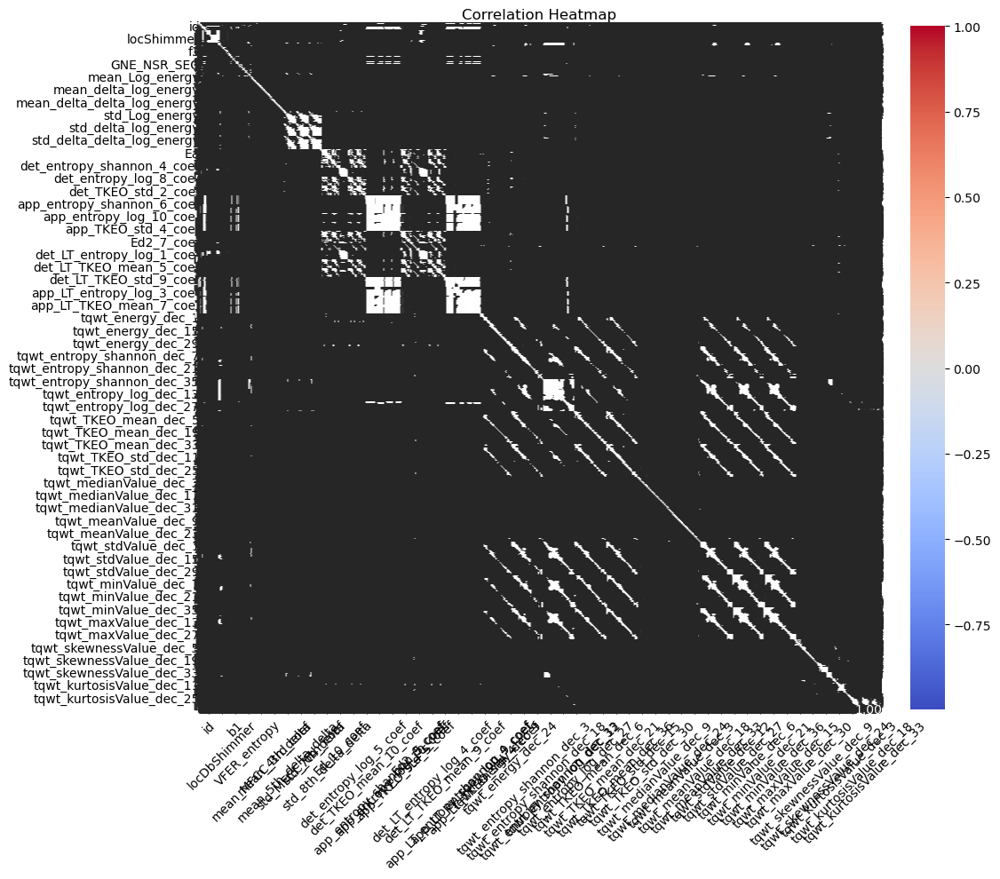

In [24]:
"""import matplotlib.pyplot as plt
import seaborn as sns

corr = data.corr()
plt.figure(figsize=(12, 12))  # Adjust the figure size to your preference
sns.heatmap(corr, xticklabels=corr.columns.values, yticklabels=corr.columns.values)
plt.show()  # Display the plot
"""
import matplotlib.pyplot as plt
import seaborn as sns

# Ensure the 'data' variable is properly defined and contains your dataset

# Calculate the correlation matrix
corr = data.corr()

# Set up the figure size
plt.figure(figsize=(12, 10))  # You can adjust the size as needed

# Create the heatmap
sns.heatmap(corr, annot=True, cmap='coolwarm', fmt=".2f")

# Rotate the x-axis labels for better visibility if there are many features
plt.xticks(rotation=45)

# Set title and display the plot
plt.title('Correlation Heatmap')
plt.show()

In [26]:
corr=data.corr().abs()

# Select upper triangle of correlation matrix
upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))

# Find index of feature columns with correlation greater than 0.6
to_drop = [column for column in upper.columns if any(upper[column] > 0.6)]

# Drop features 
for column in to_drop:  
  data=data.drop(column,axis=1)

C:\Users\ASUS\AppData\Local\Temp\ipykernel_6976\3400174622.py:4: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  upper = corr.where(np.triu(np.ones(corr.shape), k=1).astype(np.bool))


C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='class', ylabel='count'>

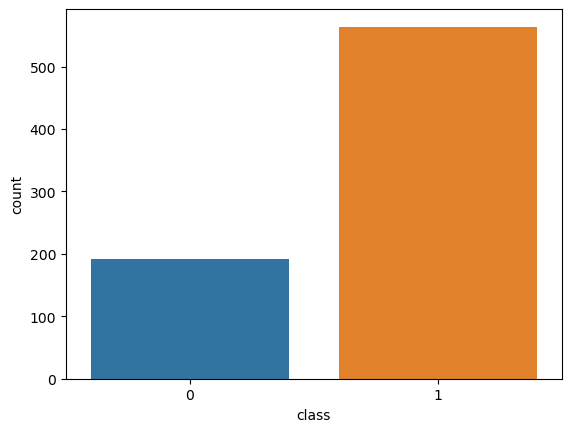

In [28]:
sns.countplot("class",data=data)

In [30]:
from sklearn.utils import resample
#seperating minority and majority class
class_1=data[data['class']==0]
class_2=data[data['class']==1]
#upsampled minor sample
class_2_upsampled=resample(class_2,replace=True,n_samples=len(class_1),random_state=27)
#combine majority and unsampled minor sample
upsampled=pd.concat([class_1,class_2_upsampled])


In [31]:
# checking new class counts
upsampled['class'].value_counts()

0    192
1    192
Name: class, dtype: int64

C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='class', ylabel='count'>

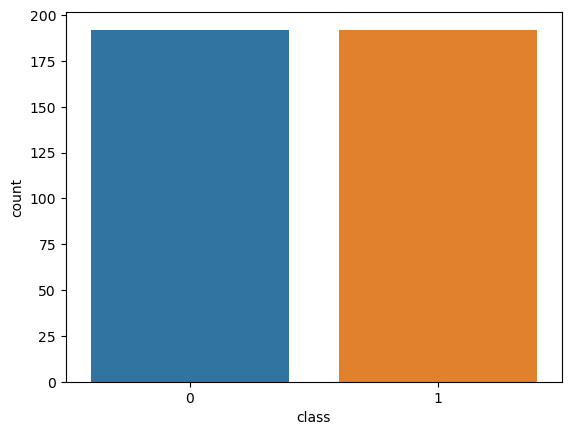

In [32]:
features = upsampled.drop('class', axis = 1)
label = upsampled['class']

sns.countplot("class",data=upsampled)

In [33]:
features=data.drop(['class','id'],axis=1)
labels=data['class']

In [34]:
features.describe()


,gender,PPE,DFA,RPDE,numPulses,stdDevPeriodPulses,minIntensity,f1,f2,f3,...,tqwt_skewnessValue_dec_30,tqwt_kurtosisValue_dec_1,tqwt_kurtosisValue_dec_7,tqwt_kurtosisValue_dec_8,tqwt_kurtosisValue_dec_12,tqwt_kurtosisValue_dec_13,tqwt_kurtosisValue_dec_21,tqwt_kurtosisValue_dec_23,tqwt_kurtosisValue_dec_25,tqwt_kurtosisValue_dec_26
count,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,...,7.560000e+02,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000,756.000000
mean,0.515873,0.746284,0.700414,0.489058,323.972222,0.000383,70.828609,647.174519,1233.852088,2562.425251,...,3.857914e-04,1059.146612,40.408662,15.064513,9.529080,3.741615,2.300006,2.176542,6.782668,15.766942
std,0.500079,0.169294,0.069718,0.137442,99.219059,0.000728,8.858268,134.957916,169.090402,393.315598,...,3.627066e-01,3522.528562,239.548628,75.865176,36.349168,4.821202,0.868506,1.709860,31.707014,45.247304
min,0.000000,0.041551,0.543500,0.154300,2.000000,0.000011,28.651529,237.149533,761.357661,1411.231297,...,-3.210100e+00,2.507600,2.616700,2.580100,1.723900,1.667800,1.522400,1.522000,1.499600,1.482400
25%,0.000000,0.762833,0.647053,0.386537,251.000000,0.000049,67.248014,562.879119,1117.316190,2380.426103,...,-1.696650e-02,8.993000,4.544075,4.294775,3.030725,2.545750,1.805375,1.726750,1.649950,1.672925
50%,1.000000,0.809655,0.700525,0.484355,317.000000,0.000077,74.121030,641.181498,1215.344125,2612.204198,...,-1.670000e-17,21.611450,5.966600,5.368600,3.828150,3.024100,2.169700,1.935850,1.819900,1.907550
75%,1.000000,0.834315,0.754985,0.586515,384.250000,0.000171,76.850515,737.222678,1339.826741,2831.959198,...,1.337050e-02,251.897450,9.275500,7.419100,5.760800,3.685825,2.524625,2.350300,2.221500,3.057025
max,1.000000,0.907660,0.852640,0.871230,907.000000,0.003483,83.908349,1015.524047,1922.747225,3475.648017,...,2.983800e+00,29579.921900,3297.514200,1611.375100,511.721100,90.478100,14.050700,42.538200,359.560600,395.347700


C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)
C:\Users\ASUS\anaconda3\lib\site-packages\seaborn\distributions.py:2619: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level 

Text(0, 0.5, 'Percentage')

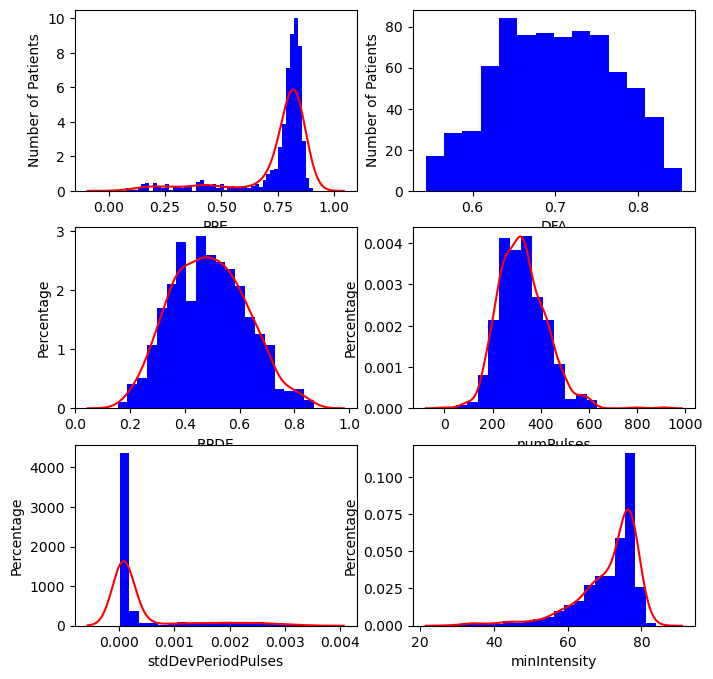

In [35]:
#visualising some of the numerical features 
fig = plt.figure(figsize=(8, 8))


ax1 = fig.add_subplot(321)
sns.distplot(data['PPE'], hist_kws={'color': 'blue', 'alpha': 1}, \
             kde_kws={'color': 'red'}, ax=ax1)
ax1.set_xlabel('PPE')
ax1.set_ylabel('Number of Patients')

ax2 = fig.add_subplot(322)
sns.distplot(data['DFA'], hist_kws={'color': 'blue', 'alpha': 1}, \
             kde_kws={'color': 'red'}, kde=False, ax=ax2)
ax2.set_xlabel('DFA')
ax2.set_ylabel('Number of Patients')

ax3 = fig.add_subplot(323)
sns.distplot(data['RPDE'], hist_kws={'color': 'blue', 'alpha': 1}, \
             kde_kws={'color': 'red'}, bins=20, ax=ax3)
ax3.set_xlabel('RPDE')
ax3.set_ylabel('Percentage')

ax4 = fig.add_subplot(324)
sns.distplot(data['numPulses'], hist_kws={'color': 'blue', 'alpha': 1}, \
             kde_kws={'color': 'red'}, bins=20, ax=ax4)
ax4.set_xlabel('numPulses')
ax4.set_ylabel('Percentage')

ax5 = fig.add_subplot(325)
sns.distplot(data['stdDevPeriodPulses'], hist_kws={'color': 'blue', 'alpha': 1}, \
             kde_kws={'color': 'red'}, bins=20, ax=ax5)
ax5.set_xlabel('stdDevPeriodPulses')
ax5.set_ylabel('Percentage')

ax6 = fig.add_subplot(326)
sns.distplot(data['minIntensity'], hist_kws={'color': 'blue', 'alpha': 1}, \
             kde_kws={'color': 'red'}, bins=20, ax=ax6)
ax6.set_xlabel('minIntensity')
ax6.set_ylabel('Percentage')


In [36]:
from sklearn.preprocessing import StandardScaler
standardScalerX = StandardScaler()
features =pd.DataFrame(standardScalerX.fit_transform(features), columns = features.columns, index = features.index)

In [37]:
from sklearn.model_selection import train_test_split
features_train, features_test, labels_train, labels_test = train_test_split(features, labels, test_size=0.2, random_state=0)

In [38]:
features_train.head(250)

,gender,PPE,DFA,RPDE,numPulses,stdDevPeriodPulses,minIntensity,f1,f2,f3,...,tqwt_skewnessValue_dec_30,tqwt_kurtosisValue_dec_1,tqwt_kurtosisValue_dec_7,tqwt_kurtosisValue_dec_8,tqwt_kurtosisValue_dec_12,tqwt_kurtosisValue_dec_13,tqwt_kurtosisValue_dec_21,tqwt_kurtosisValue_dec_23,tqwt_kurtosisValue_dec_25,tqwt_kurtosisValue_dec_26
354,-1.032266,0.084263,-0.351992,-0.803031,0.565061,-0.473261,-1.022043,0.281976,0.033444,-0.083985,...,-0.241040,-0.297685,-0.146315,-0.138499,-0.160913,-0.012083,0.198972,-0.201461,-0.152779,-0.300481
252,-1.032266,0.532598,1.480741,-0.413884,1.170184,-0.410002,-0.808077,0.845659,-0.343294,1.244928,...,-0.001064,-0.286000,-0.104176,-0.130105,-0.102207,-0.125096,0.841420,-0.329451,-0.153931,1.113262
97,0.968742,0.122683,1.697758,0.153128,-1.038514,-0.442594,-2.026528,-1.622479,-1.217989,-1.502144,...,-0.001064,0.048462,-0.131336,-0.106320,-0.060415,0.151097,1.762345,-0.034027,-0.143883,-0.306826
522,0.968742,0.440508,0.003962,0.046540,-0.362794,-0.447957,0.658154,-0.985084,0.575904,0.316080,...,-0.830934,-0.296649,-0.147973,-0.150745,-0.182234,-0.263597,1.127272,-0.248280,-0.151548,-0.304402
466,0.968742,0.075338,0.938485,0.932661,-0.947746,-0.093848,0.363318,-0.522115,0.722736,-0.703269,...,2.038351,-0.296682,-0.138573,-0.114735,-0.125932,0.041383,1.622012,-0.148147,-0.081325,-0.294587
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
412,-1.032266,0.309820,1.487343,0.619231,-0.140915,-0.441081,-0.705859,0.560766,0.499932,1.296008,...,0.249141,-0.298175,-0.143898,-0.141049,-0.040861,0.650908,2.889163,-0.071013,-0.136097,-0.242669
651,0.968742,0.322764,0.601764,-0.490330,0.565061,-0.472161,-1.651504,0.184723,-0.595549,-0.929132,...,-1.067838,-0.262544,-0.143576,-0.138626,-0.131415,-0.253365,-0.248759,-0.084298,-0.158804,-0.292205
618,-1.032266,0.417574,-0.728758,-1.045038,1.119757,-0.440119,-0.147187,0.023401,-1.332941,-1.914144,...,0.319296,-0.186056,-0.129920,-0.145123,-0.189232,-0.177670,-0.146792,0.013318,-0.153038,0.869114
300,0.968742,0.626225,-0.107273,0.860292,-0.816636,-0.385196,-0.311279,-0.014895,-0.392672,0.988799,...,3.880672,-0.296565,-0.128690,-0.114296,-0.111817,-0.125325,1.196056,0.388744,-0.144261,-0.304424


In [39]:
models = {
    '           Linear SVM': LinearSVC(),
    '    Gradient Boosting': GradientBoostingClassifier(),
    '        Decision Tree': DecisionTreeClassifier(),
    '        Random Forest': RandomForestClassifier(),

}

for name, model in models.items():
    model = model.fit(features_train, labels_train)
    print(name + " trained")

C:\Users\ASUS\anaconda3\lib\site-packages\sklearn\svm\_base.py:1206: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


           Linear SVM trained
    Gradient Boosting trained
        Decision Tree trained
        Random Forest trained


In [40]:
for name, model in models.items():
    print(name + ": {:.2f}%".format(model.score(features_test, labels_test) * 100))

           Linear SVM: 73.03%
    Gradient Boosting: 86.84%
        Decision Tree: 75.66%
        Random Forest: 84.21%
